# This notebook consists of 6 parts:
1. Loading, exploring and cleaning dataset
2. Feature engineering
3. Exploratory data analysis (EDA)
4. Modeling using Machine Learning:
    - Baseline LR model
    - Baseline LR model with scaling
    - DT with scaling
    - XGB Regressor with scaling
    - XGB Regressor with cross-validate
    - XGB Regressor time-series prediction
5. Modeling using Deep Learning:
    - Conversion of the time-series problem to supervised learning one
    - Vanila LSTM using one previous hour data point to predict the next one
    - Vanila LSTM using five previous hour data points to predict the next one
    - Multi-step LSTM using 5 previous hourly data points to predict 3 future ones
6. Conclusion and future work

- Source of dataset:
    https://archive.ics.uci.edu/ml/datasets/individual+household+electric+power+consumption

- References:
    - Deep Learning for Time Series Forecasting, Jason Brownlee
    - Code: https://www.kaggle.com/code/winternguyen/predict-household-electric-power-using-lstm/notebook

In [1]:
import numpy as np
import pandas as pd
import datetime as dt

import matplotlib.pyplot as plt
import seaborn as sns
from plotly import subplots

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score    

from tqdm import tqdm # Shows progress of executing an iterable
import warnings
warnings.filterwarnings('ignore')

## 1. Loading, Exploring and Cleaning the Dataset

In [2]:
df = pd.read_csv('household_power_consumption.txt', sep=';')
df

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,16/12/2006,17:24:00,4.216,0.418,234.840,18.400,0.000,1.000,17.0
1,16/12/2006,17:25:00,5.360,0.436,233.630,23.000,0.000,1.000,16.0
2,16/12/2006,17:26:00,5.374,0.498,233.290,23.000,0.000,2.000,17.0
3,16/12/2006,17:27:00,5.388,0.502,233.740,23.000,0.000,1.000,17.0
4,16/12/2006,17:28:00,3.666,0.528,235.680,15.800,0.000,1.000,17.0
...,...,...,...,...,...,...,...,...,...
2075254,26/11/2010,20:58:00,0.946,0.0,240.43,4.0,0.0,0.0,0.0
2075255,26/11/2010,20:59:00,0.944,0.0,240.0,4.0,0.0,0.0,0.0
2075256,26/11/2010,21:00:00,0.938,0.0,239.82,3.8,0.0,0.0,0.0
2075257,26/11/2010,21:01:00,0.934,0.0,239.7,3.8,0.0,0.0,0.0


In [3]:
df.shape

(2075259, 9)

In [4]:
# There are no duplicates
df.shape == df.drop_duplicates().shape

True

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075259 entries, 0 to 2075258
Data columns (total 9 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Date                   object 
 1   Time                   object 
 2   Global_active_power    object 
 3   Global_reactive_power  object 
 4   Voltage                object 
 5   Global_intensity       object 
 6   Sub_metering_1         object 
 7   Sub_metering_2         object 
 8   Sub_metering_3         float64
dtypes: float64(1), object(8)
memory usage: 142.5+ MB


In [6]:
# Check if there are null values
df.isna().sum()

Date                         0
Time                         0
Global_active_power          0
Global_reactive_power        0
Voltage                      0
Global_intensity             0
Sub_metering_1               0
Sub_metering_2               0
Sub_metering_3           25979
dtype: int64

In [7]:
# Calculate the missing values % contribution in the dataframe

round(100*(df.isnull().sum())/df.shape[0], 2)

Date                     0.00
Time                     0.00
Global_active_power      0.00
Global_reactive_power    0.00
Voltage                  0.00
Global_intensity         0.00
Sub_metering_1           0.00
Sub_metering_2           0.00
Sub_metering_3           1.25
dtype: float64

In [8]:
# I can drop the NAN since it is only 1.25%
df = df.dropna()

In [9]:
# Change the columns to float:
df.iloc[:, 2:8] = df.iloc[:, 2:8].astype(float)

# Or:
# df.columns
# df[['Global_active_power', 'Global_reactive_power',
#        'Voltage', 'Global_intensity', 'Sub_metering_1', 'Sub_metering_2',
#        'Sub_metering_3']] = df[['Global_active_power', 'Global_reactive_power',
#        'Voltage', 'Global_intensity', 'Sub_metering_1', 'Sub_metering_2',
#        'Sub_metering_3']].astype(float)

In [10]:
# Create a datetime column
df['Date_time'] = pd.to_datetime(df['Date'] + ' ' + df['Time'].astype(str))

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2049280 entries, 0 to 2075258
Data columns (total 10 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   Date                   object        
 1   Time                   object        
 2   Global_active_power    float64       
 3   Global_reactive_power  float64       
 4   Voltage                float64       
 5   Global_intensity       float64       
 6   Sub_metering_1         float64       
 7   Sub_metering_2         float64       
 8   Sub_metering_3         float64       
 9   Date_time              datetime64[ns]
dtypes: datetime64[ns](1), float64(7), object(2)
memory usage: 172.0+ MB


## 2. Feature Engineering
- Since I want to solve this using ML, I will engineer features from date and time
- Those features are expected to have imapct on the power consumption, due to seasonal and temporal effect
- This will be confirmed in the EDA part

In [12]:
# New features:
df['Year'] = df['Date_time'].dt.year
df['Month'] = df['Date_time'].dt.month
df['DayofWeek'] = df['Date_time'].dt.dayofweek
df['Hour'] = df['Date_time'].dt.hour

In [13]:
# Create the target (Refer to the UCI Dataset instruction)
df['Power_consumption'] = df['Global_active_power'] * 1000/60 - \
df['Sub_metering_1'] - df['Sub_metering_2'] - df['Sub_metering_3']

In [14]:
df

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Date_time,Year,Month,DayofWeek,Hour,Power_consumption
0,16/12/2006,17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0,2006-12-16 17:24:00,2006,12,5,17,52.266667
1,16/12/2006,17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0,2006-12-16 17:25:00,2006,12,5,17,72.333333
2,16/12/2006,17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0,2006-12-16 17:26:00,2006,12,5,17,70.566667
3,16/12/2006,17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0,2006-12-16 17:27:00,2006,12,5,17,71.800000
4,16/12/2006,17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0,2006-12-16 17:28:00,2006,12,5,17,43.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2075254,26/11/2010,20:58:00,0.946,0.000,240.43,4.0,0.0,0.0,0.0,2010-11-26 20:58:00,2010,11,4,20,15.766667
2075255,26/11/2010,20:59:00,0.944,0.000,240.00,4.0,0.0,0.0,0.0,2010-11-26 20:59:00,2010,11,4,20,15.733333
2075256,26/11/2010,21:00:00,0.938,0.000,239.82,3.8,0.0,0.0,0.0,2010-11-26 21:00:00,2010,11,4,21,15.633333
2075257,26/11/2010,21:01:00,0.934,0.000,239.70,3.8,0.0,0.0,0.0,2010-11-26 21:01:00,2010,11,4,21,15.566667


In [15]:
# Drop columns that are not to be used
df = df.drop(columns=['Date', 'Time', 'Global_active_power', 'Global_reactive_power', 'Voltage', 'Global_intensity', 
                              'Sub_metering_1', 'Sub_metering_2', 'Sub_metering_3'])

In [16]:
df.describe()

,Year,Month,DayofWeek,Hour,Power_consumption
count,2.049280e+06,2.049280e+06,2.049280e+06,2.049280e+06,2.049280e+06
mean,2.008425e+03,6.497968e+00,2.992479e+00,1.150391e+01,9.314693e+00
std,1.124388e+00,3.446016e+00,1.996235e+00,6.925189e+00,9.585916e+00
min,2.006000e+03,1.000000e+00,0.000000e+00,0.000000e+00,-2.400000e+00
25%,2.007000e+03,4.000000e+00,1.000000e+00,5.000000e+00,3.800000e+00
50%,2.008000e+03,7.000000e+00,3.000000e+00,1.200000e+01,5.500000e+00
75%,2.009000e+03,1.000000e+01,5.000000e+00,1.800000e+01,1.036667e+01
max,2.010000e+03,1.200000e+01,6.000000e+00,2.300000e+01,1.248333e+02


## 3. Exploratory Data Analysis (EDA)

### The distribution of the power consumption over hour, dayofweek, month and year:

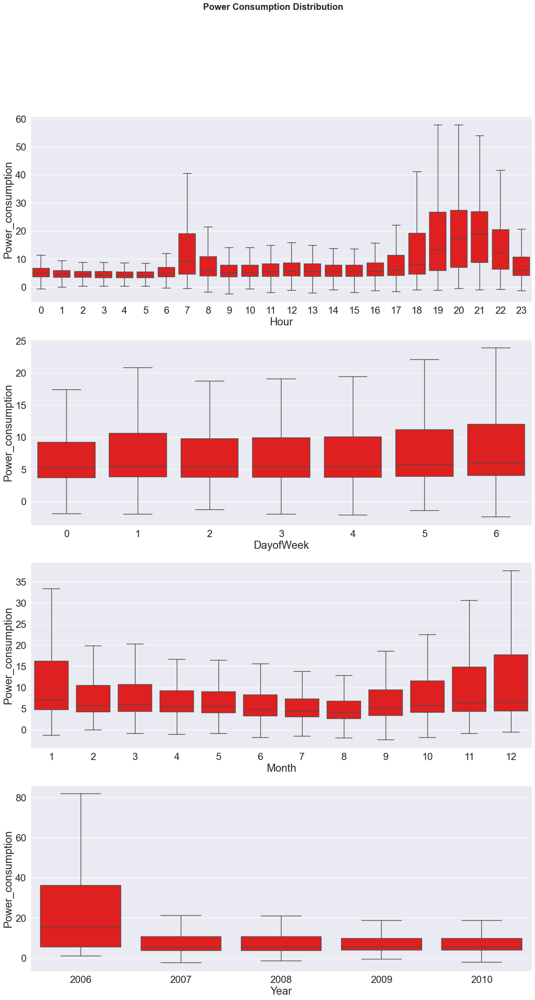

In [17]:
rows = ['Hour', 'DayofWeek', 'Month', 'Year']

sns.set(font_scale=2)

f, axes = plt.subplots(nrows=4, ncols=1, figsize=(20, 35))
f.suptitle('Power Consumption Distribution', weight='bold', fontsize=20)

for i, row in enumerate(rows):
    sns.boxplot(data=df, x=row, y='Power_consumption', ax=axes.flatten()[i], color='red', showfliers = False)

#### Conclusion:
- The distribution of average hourly electric power consumption matches the minute trends
- The distribution of average monthly consumption is wider on the weekend
- The distribution of average monthly consumption is wider between November and January
- The 2006 year distribution is not representative since it has only one month. So the year engineered feature is going to be eliminated from the modelling

### Crrelation

In [18]:
df.corr().style.background_gradient(cmap="coolwarm") # try 'Blues'

,Year,Month,DayofWeek,Hour,Power_consumption
Year,1.000000,-0.073940,-0.000441,-0.000785,-0.088137
Month,-0.073940,1.000000,0.000453,-0.000936,0.013474
DayofWeek,-0.000441,0.000453,1.000000,-0.000417,0.038672
Hour,-0.000785,-0.000936,-0.000417,1.000000,0.294831
Power_consumption,-0.088137,0.013474,0.038672,0.294831,1.000000


In [23]:
df.corr().loc[df.corr()['Power_consumption'].idxmax()].iloc[1:4].sort_values(ascending = False)

Hour         0.294831
DayofWeek    0.038672
Month        0.013474
Name: Power_consumption, dtype: float64

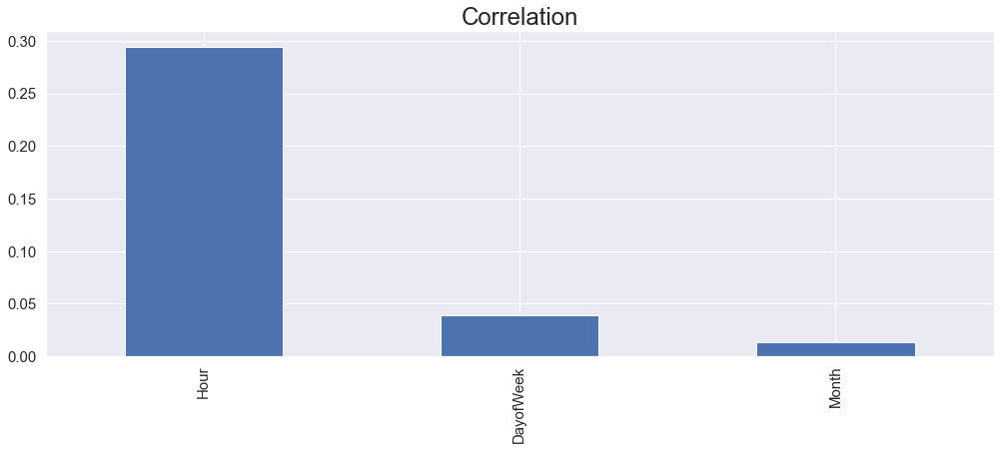

In [22]:
df.corr().loc[df.corr()['Power_consumption'].idxmax()].iloc[1:4].sort_values(ascending = False).plot(kind='bar', title='Correlation', fontsize=15, figsize=(17, 6));

#### Conclusion:
- Based on the previous analysis, four (3) new features were engineered from the date and time, to be used in the Machine Learning modelling

- The correlation numbers show that the Hour is the highest time-related feature that affects the electric power consumption

### Energy distribution

In [27]:
import logging
logging.getLogger().setLevel(logging.CRITICAL) # Prevent the matplotlib infos on categorical x-axis, removable

Text(0.5, 1.0, 'Energy Distribution')

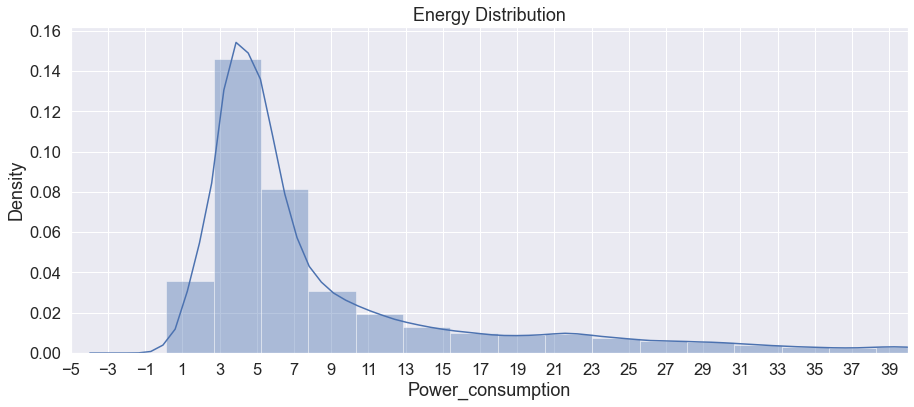

In [28]:
# Energy distribution
sns.set(font_scale=1.5)
fig, ax = plt.subplots()
sns.distplot(df["Power_consumption"], ax=ax)
ax.set_xlim(-5, 40)
ax.set_xticks(range(-5,40,2))
plt.title("Energy Distribution")

### Power consumption change with time

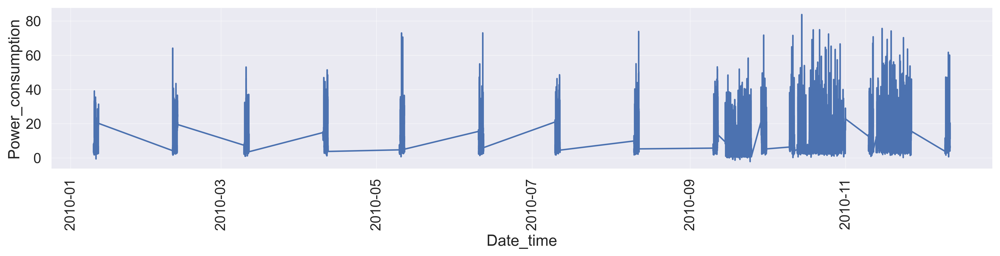

In [29]:
# Trend over months
sns.set(font_scale=1.3)
plt.rcParams.update({'figure.figsize': (17, 3), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=df.tail(100000), x='Date_time', y='Power_consumption')
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

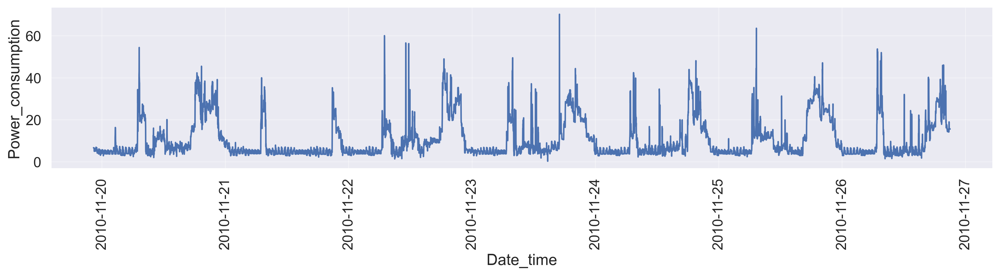

In [30]:
# Trend over days
sns.set(font_scale=1.3)
plt.rcParams.update({'figure.figsize': (17, 3), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=df.tail(10000), x='Date_time', y='Power_consumption')
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

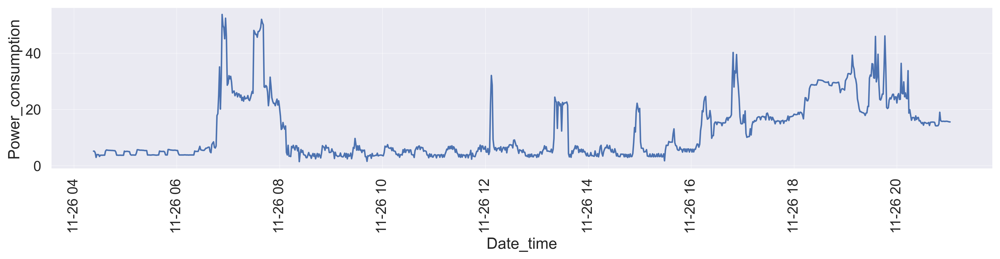

In [31]:
# Trend over hours
sns.set(font_scale=1.3)
plt.rcParams.update({'figure.figsize': (17, 3), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=df.tail(1000), x='Date_time', y='Power_consumption')
# sns.lineplot(data=df.iloc[-1000:-1], x='Date_time', y='Power_consumption')
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

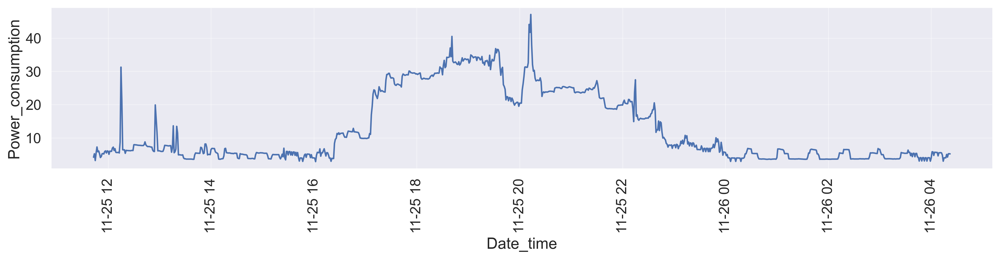

In [32]:
sns.set(font_scale=1.3)
plt.rcParams.update({'figure.figsize': (17, 3), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=df.iloc[-2000:-1000], x='Date_time', y='Power_consumption')
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

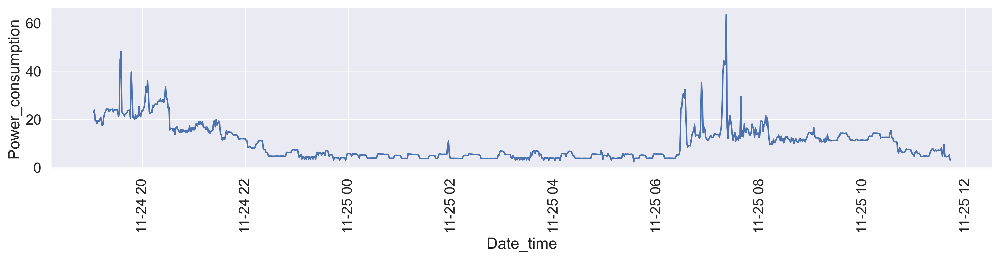

In [33]:
sns.set(font_scale=1.3)
plt.rcParams.update({'figure.figsize': (17, 3), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=df.iloc[-3000:-2000], x='Date_time', y='Power_consumption')
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

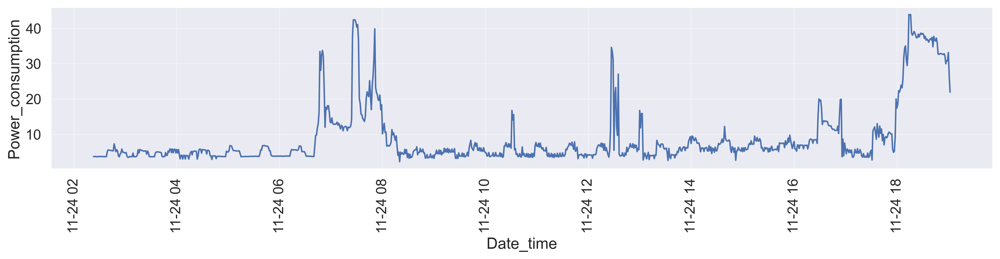

In [34]:
sns.set(font_scale=1.3)
plt.rcParams.update({'figure.figsize': (17, 3), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=df.iloc[-4000:-3000], x='Date_time', y='Power_consumption')
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

#### Conclusion:
- The four (4) graphs above (trend over hours) show the trend of one-minute electric power consumption over two days
- The minute consumption fluctuates around 5 kW during most of the day
- The minute consumption peaks around 6-8am and 6-10pm

### Resampling over time

In [88]:
df_new = df.copy()
df_new = df_new.set_index(['Date_time'])

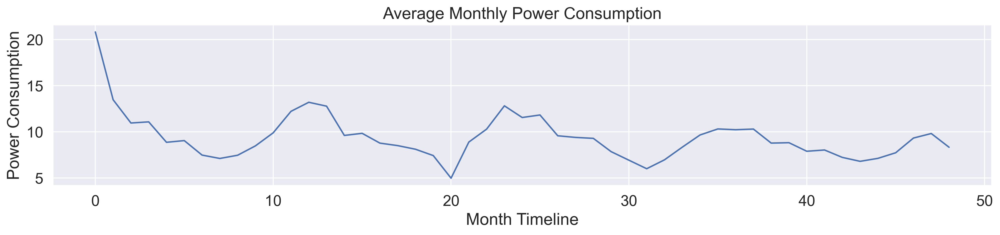

In [89]:
plt.figure(figsize=(17, 3))
plt.plot(df_new.resample('M').mean().values[:, 4])
plt.title('Average Monthly Power Consumption')
plt.xlabel("Month Timeline")
plt.ylabel("Power Consumption")
plt.show()

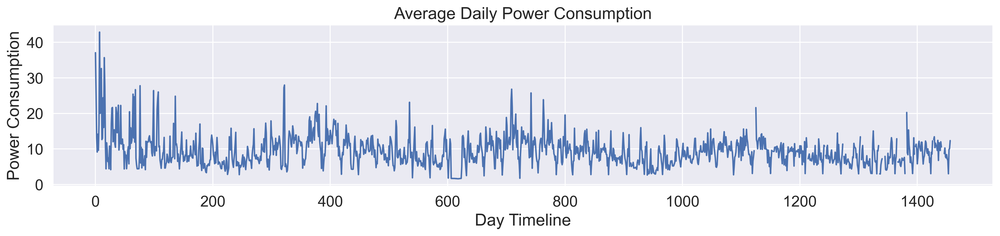

In [90]:
plt.figure(figsize=(17, 3))
plt.plot(df_new.resample('D').mean().values[:, 4])
plt.title('Average Daily Power Consumption')
plt.xlabel("Day Timeline")
plt.ylabel("Power Consumption")
plt.show()

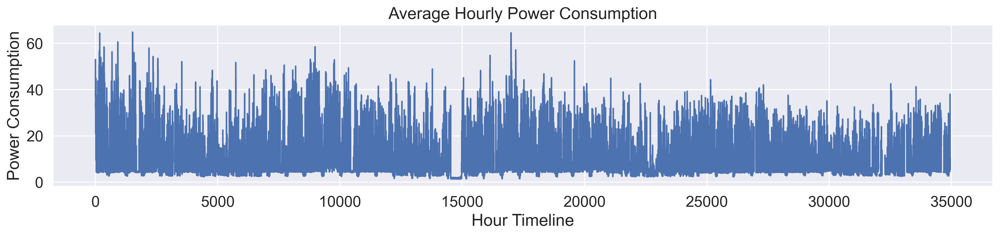

In [91]:
plt.figure(figsize=(17, 3))
plt.plot(df_new.resample('H').mean().values[:, 4])
plt.title('Average Hourly Power Consumption')
plt.xlabel("Hour Timeline")
plt.ylabel("Power Consumption")
plt.show()

## 4. Modeling using Machine Learning

### Basline model

In [39]:
# Logistic Regression:

features = ['Month', 'Hour', 'DayofWeek']
X = df[features]
y = df['Power_consumption']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('MSE', mean_squared_error(y_test, y_pred))
print('R2', r2_score(y_test, y_pred))

MSE 83.15425764019301
R2 0.08989794995492828


In [40]:
# LR With scaling:

features = ['Month', 'Hour', 'DayofWeek']
X = df[features]
y = df['Power_consumption']

scaler = MinMaxScaler()
scaler.fit(X)

X_scaled = scaler.transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.30, random_state=42)

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('MSE', mean_squared_error(y_test, y_pred))
print('R2', r2_score(y_test, y_pred))

MSE 83.15425764019305
R2 0.08989794995492773


### Decision Tree model

In [41]:
# Note that we do not need to scale

features = ['Month', 'Hour', 'DayofWeek']
X = df[features]
y = df['Power_consumption']

scaler = MinMaxScaler()
scaler.fit(X)

X_scaled = scaler.transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.30, random_state=42)

model = DecisionTreeRegressor()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('MSE', mean_squared_error(y_test, y_pred))
print('R2', r2_score(y_test, y_pred))

MSE 65.41834423107447
R2 0.2840129791925724


#### Conclusion
- Logistic regression model performed poorly, as seen in the R2 score
- This is expected as it models a linear regression
- Although Decision Tree performed much better than LR, its R2 score is low. However, with hyper-parameters tuning, it is expected to improve

### XGB Regressor

In [42]:
features = ['Month', 'Hour', 'DayofWeek']
X = df[features]
y = df['Power_consumption']

scaler = MinMaxScaler()
scaler.fit(X)

X_scaled = scaler.transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.30, random_state=42)

model = XGBRegressor(n_estimators=500, learning_rate=0.01)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('MSE', mean_squared_error(y_test, y_pred))
print('R2', r2_score(y_test, y_pred))

MSE 66.26210471567353
R2 0.27477823681650126


In [48]:
# XGBRegressor cross-validate
from sklearn.model_selection import cross_validate 
xgb_scores = cross_validate(model, X, y, cv=5, scoring=['neg_mean_squared_error', 'r2'], n_jobs=4)

In [49]:
print('XGB MSE=', xgb_scores['test_neg_mean_squared_error'].mean()*-1, ',\tXGB R2 =', xgb_scores['test_r2'].mean())

XGB MSE= 69.81654421583985 ,	XGB R2 = 0.22773259603665133


### Conclusion:
- XGB Regressor performed similar to Decision Tree 
- The score was checked with cross_validate and the performance of the model is steady

### XGBRegressor example of time-series prediction

In [50]:
df['Date_time'].max()

Timestamp('2010-12-11 23:59:00')

In [51]:
train_df = df[(df['Date_time'] < '2010-11-08') & (df['Date_time'] >= '2010-05-01')]
test_df = df[df['Date_time'] >= '2010-11-08']

X_train, y_train = train_df[features], train_df['Power_consumption']
X_test, y_test = test_df[features], test_df['Power_consumption']

model = XGBRegressor(n_estimators=500, learning_rate=0.01)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('MSE', mean_squared_error(y_test, y_pred))
print('R2', r2_score(y_test, y_pred))

MSE 59.24861468573801
R2 0.15810422357413334


In [52]:
test_df = test_df.reset_index().drop('index', axis=1)
test_df['predictions'] = pd.Series(y_pred)

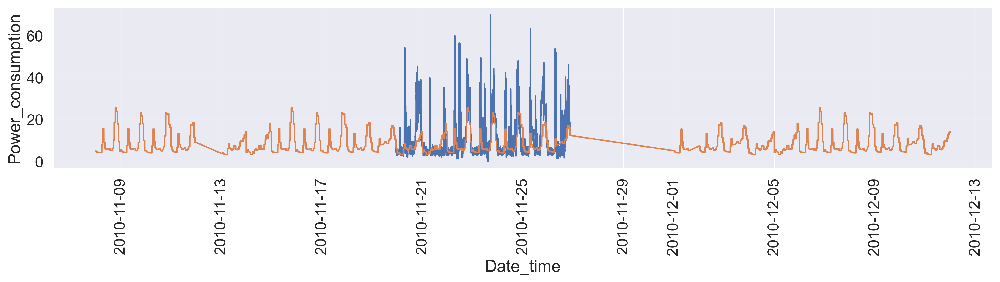

In [53]:
sns.set(font_scale=1.4)
plt.rcParams.update({'figure.figsize': (17, 3), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=df.tail(10000), x='Date_time', y='Power_consumption')
sns.lineplot(data=test_df, x='Date_time', y='predictions')
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

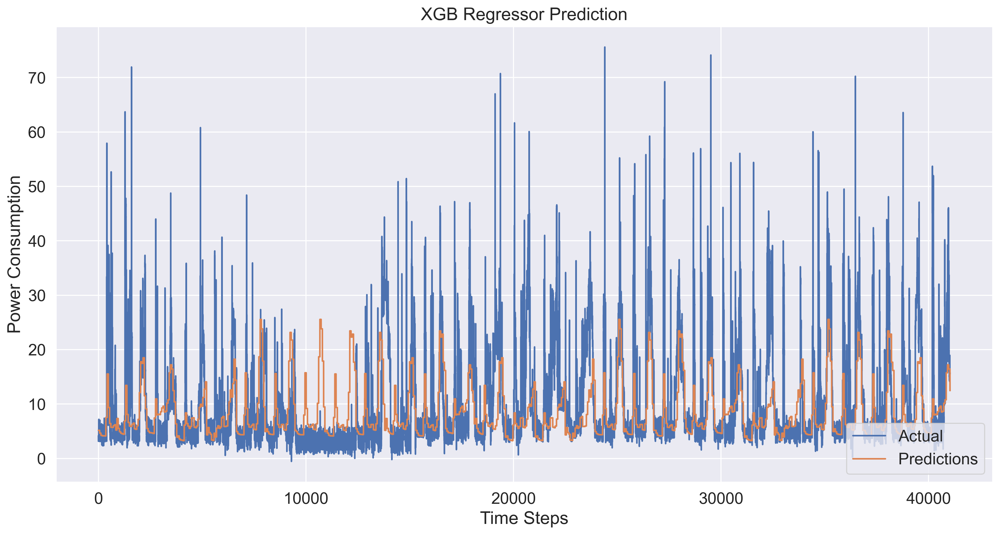

In [54]:
sns.set(font_scale=1.4)
plt.figure(figsize=(16,8))
plt.title('XGB Regressor Prediction')
plt.xlabel('Time Steps')
plt.ylabel('Power Consumption')
plt.plot(test_df[['Power_consumption', 'predictions']])
plt.legend(['Actual', 'Predictions'], loc='lower right')
plt.show()

#### Conclusion:
- XGB Regressor produced better results, as can be seen in the graph
- The prediction trend repeats in certain pattern as it takes in account the time-related features over the whole training set


## 5. Modelling using Deep Learning

### Conversion of the time-series problem to supervised learning one
- Use hourly resampling
- Convert the time-series to supervised learning

In [55]:
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers.core import Dense, Activation, Dropout
from tensorflow.keras.layers import LSTM
from keras.models import Sequential

In [94]:
df_resample = df_new.resample('h').mean() 
df_resample.shape

(34951, 5)

In [95]:
df_resample

,Year,Month,DayofWeek,Hour,Power_consumption
Date_time,,,,,
2006-12-16 17:00:00,2006.0,12.0,5.0,17.0,52.992593
2006-12-16 18:00:00,2006.0,12.0,5.0,18.0,36.953333
2006-12-16 19:00:00,2006.0,12.0,5.0,19.0,38.553889
2006-12-16 20:00:00,2006.0,12.0,5.0,20.0,37.692778
2006-12-16 21:00:00,2006.0,12.0,5.0,21.0,33.307778
...,...,...,...,...,...
2010-12-11 19:00:00,2010.0,12.0,5.0,19.0,26.382778
2010-12-11 20:00:00,2010.0,12.0,5.0,20.0,10.005556
2010-12-11 21:00:00,2010.0,12.0,5.0,21.0,9.581667


In [96]:
df_resample = df_resample.drop(columns=['Year', 'Month', 'DayofWeek', 'Hour'])

In [97]:
df_resample

,Power_consumption
Date_time,
2006-12-16 17:00:00,52.992593
2006-12-16 18:00:00,36.953333
2006-12-16 19:00:00,38.553889
2006-12-16 20:00:00,37.692778
2006-12-16 21:00:00,33.307778
...,...
2010-12-11 19:00:00,26.382778
2010-12-11 20:00:00,10.005556
2010-12-11 21:00:00,9.581667


In [61]:
# The function is from 'Deep Learning for Time Series Forecasting', Jason Brownlee

def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    """
    Frame a time series as a supervised learning dataset.
    Arguments:
        data: Sequence of observations as a list or NumPy array.
        n_in: Number of lag observations as input (X).
        n_out: Number of observations as output (y).
        dropnan: Boolean whether or not to drop rows with NaN values.
    Returns:
        Pandas DataFrame of series framed for supervised learning.
    """
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [62]:
# Scaling the power consumption values
values = df_resample.values
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
scaled

array([[0.81334629],
       [0.56059147],
       [0.58581384],
       ...,
       [0.1292548 ],
       [0.06244747],
       [0.14631776]])

### Vanila LSTM using one previous hour data point to predict the next one
- Part of this code is developed based on the methodology from:
    - https://www.kaggle.com/code/winternguyen/predict-household-electric-power-using-lstm/notebook

In [63]:
# Creating a supervised dataframe
reframed = series_to_supervised(scaled, 1, 1)
reframed

,var1(t-1),var1(t)
1,0.813346,0.560591
2,0.560591,0.585814
3,0.585814,0.572244
4,0.572244,0.503143
5,0.503143,0.484145
...,...,...
34946,0.577313,0.394015
34947,0.394015,0.135935
34948,0.135935,0.129255
34949,0.129255,0.062447


In [64]:
values = reframed.values
values

array([[0.81334629, 0.56059147],
       [0.56059147, 0.58581384],
       [0.58581384, 0.57224401],
       ...,
       [0.13593465, 0.1292548 ],
       [0.1292548 , 0.06244747],
       [0.06244747, 0.14631776]])

In [65]:
# Create the train and test data. Only 4000 first data points are the train set.
n_train_time = 4000
train = values[:n_train_time, :]
test = values[n_train_time:, :]
train_x, train_y = train[:, :-1], train[:, -1]
test_x, test_y = test[:, :-1], test[:, -1]
train_x = train_x.reshape((train_x.shape[0], 1, train_x.shape[1]))
test_x = test_x.reshape((test_x.shape[0], 1, test_x.shape[1]))

In [66]:
model = Sequential()
model.add(LSTM(100, input_shape=(train_x.shape[1], train_x.shape[2])))
model.add(Dropout(0.1))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

history = model.fit(train_x, train_y, epochs=50, batch_size=70, validation_data=(test_x, test_y), verbose=2, shuffle=False)

Epoch 1/50
58/58 - 3s - loss: 0.0346 - val_loss: 0.0120 - 3s/epoch - 60ms/step
Epoch 2/50
58/58 - 1s - loss: 0.0206 - val_loss: 0.0101 - 858ms/epoch - 15ms/step
Epoch 3/50
58/58 - 1s - loss: 0.0171 - val_loss: 0.0085 - 852ms/epoch - 15ms/step
Epoch 4/50
58/58 - 1s - loss: 0.0139 - val_loss: 0.0074 - 886ms/epoch - 15ms/step
Epoch 5/50
58/58 - 1s - loss: 0.0118 - val_loss: 0.0069 - 853ms/epoch - 15ms/step
Epoch 6/50
58/58 - 1s - loss: 0.0108 - val_loss: 0.0068 - 855ms/epoch - 15ms/step
Epoch 7/50
58/58 - 1s - loss: 0.0104 - val_loss: 0.0068 - 846ms/epoch - 15ms/step
Epoch 8/50
58/58 - 1s - loss: 0.0104 - val_loss: 0.0068 - 850ms/epoch - 15ms/step
Epoch 9/50
58/58 - 1s - loss: 0.0103 - val_loss: 0.0068 - 863ms/epoch - 15ms/step
Epoch 10/50
58/58 - 1s - loss: 0.0103 - val_loss: 0.0068 - 861ms/epoch - 15ms/step
Epoch 11/50
58/58 - 1s - loss: 0.0104 - val_loss: 0.0068 - 871ms/epoch - 15ms/step
Epoch 12/50
58/58 - 1s - loss: 0.0103 - val_loss: 0.0068 - 889ms/epoch - 15ms/step
Epoch 13/50
58/5

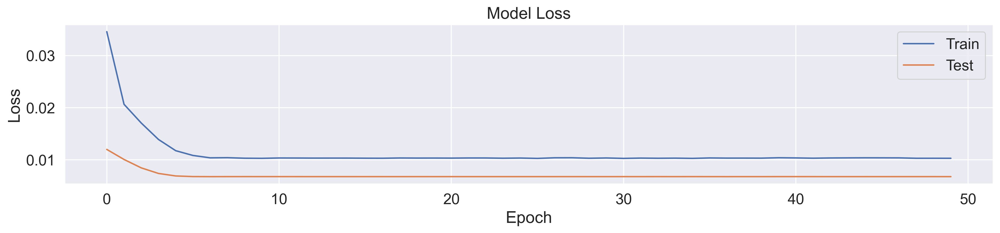

In [67]:
# Plot loss history
sns.set(font_scale=1.4)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper right')
plt.show()

In [68]:
# Prediction on the test set

size = df_resample.shape[1]

# Prediction test
yhat = model.predict(test_x)
test_x = test_x.reshape((test_x.shape[0], size))

# invert scaling for prediction
inv_yhat = np.concatenate((yhat, test_x[:, 1-size:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]

# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = np.concatenate((test_y, test_x[:, 1-size:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]

# calculate RMSE
rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

943/943 [==============================] - 2s 2ms/step
Test RMSE: 5.225


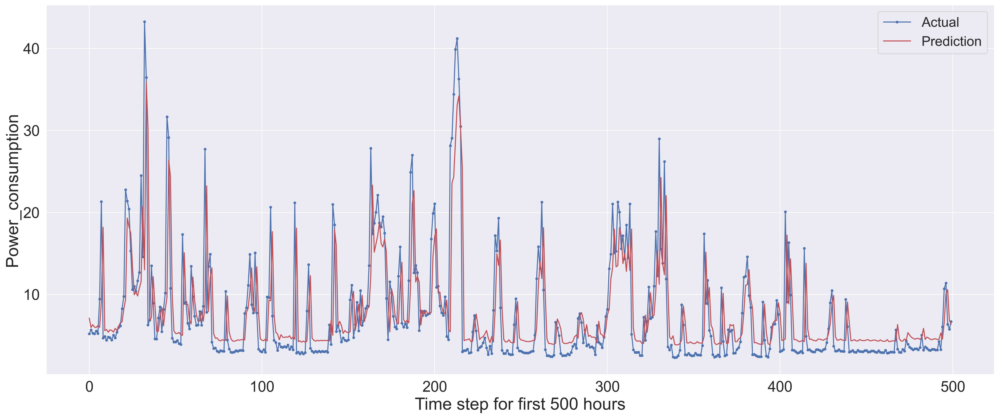

In [69]:
# Visualization of the predicted vs. actual for the first 500 time-stepps
sns.set(font_scale=2)
aa=[x for x in range(500)]
plt.figure(figsize=(25,10)) 
plt.plot(aa, inv_y[:500], marker='.', label="Actual")
plt.plot(aa, inv_yhat[:500], 'r', label="Prediction")
plt.ylabel(df.columns[5], size=25)
plt.xlabel('Time step for first 500 hours', size=25)
plt.legend(fontsize=20)
plt.show()

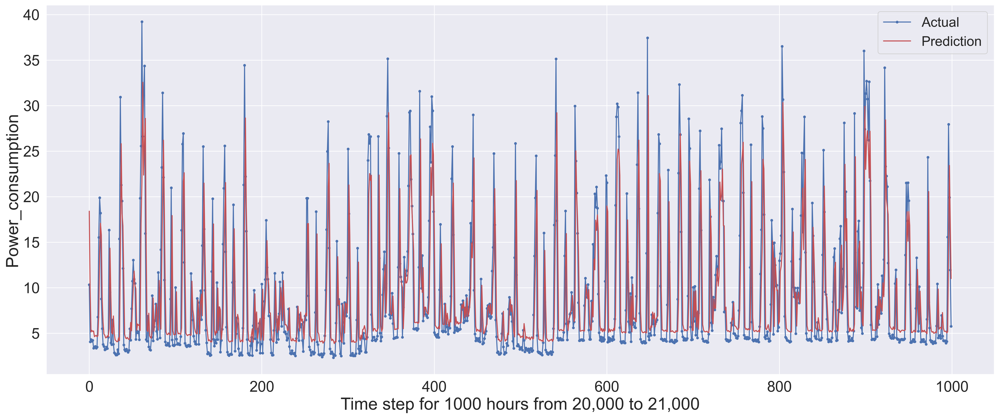

In [70]:
# Visualization of the predicted vs. actual for the 20,000 to 20,000 time-stepps
sns.set(font_scale=2)
aa=[x for x in range(1000)]
plt.figure(figsize=(25,10)) 
plt.plot(aa, inv_y[20000:21000], marker='.', label="Actual")
plt.plot(aa, inv_yhat[20000:21000], 'r', label="Prediction")
plt.ylabel(df_resample.columns[0], size=25)
plt.xlabel('Time step for 1000 hours from 20,000 to 21,000', size=25)
plt.legend(fontsize=20)
plt.show()

### Vanila LSTM using five previous hour data points to predict the next one
- Learn from several points (5 here) in the past and predict one in the future
- I used df_resample in the series_to_supervised, so that I remove the scaling

In [71]:
reframed_5_1 = series_to_supervised(df_resample, 5, 1)
reframed_5_1

,var1(t-5),var1(t-4),var1(t-3),var1(t-2),var1(t-1),var1(t)
Date_time,,,,,,
2006-12-16 22:00:00,52.992593,36.953333,38.553889,37.692778,33.307778,32.102222
2006-12-16 23:00:00,36.953333,38.553889,37.692778,33.307778,32.102222,34.276667
2006-12-17 00:00:00,38.553889,37.692778,33.307778,32.102222,34.276667,30.907778
2006-12-17 01:00:00,37.692778,33.307778,32.102222,34.276667,30.907778,30.590000
2006-12-17 02:00:00,33.307778,32.102222,34.276667,30.907778,30.590000,25.887778
...,...,...,...,...,...,...
2010-12-11 19:00:00,15.265556,14.829444,19.644444,30.851667,38.014444,26.382778
2010-12-11 20:00:00,14.829444,19.644444,30.851667,38.014444,26.382778,10.005556
2010-12-11 21:00:00,19.644444,30.851667,38.014444,26.382778,10.005556,9.581667


In [72]:
# Create the train and test data. The first 27,000 first data points are the train set.
values = reframed_5_1.values
n_train_time = 27000
train = values[:n_train_time, :]
test = values[n_train_time:, :]
train_x, train_y = train[:, :-1], train[:, -1]
test_x, test_y = test[:, :-1], test[:, -1]

In [73]:
train_x = train_x.reshape((train_x.shape[0], train_x.shape[1], 1))
test_x = test_x.reshape((test_x.shape[0], test_x.shape[1], 1))

In [74]:
model = Sequential()
model.add(LSTM(50, activation='relu', input_shape=(train_x.shape[1], 1)))
model.add(Dropout(0.1))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

history = model.fit(train_x, train_y, epochs=50, batch_size=70, validation_data=(test_x, test_y), verbose=2, shuffle=False)

Epoch 1/50
386/386 - 3s - loss: 52.9758 - val_loss: 18.1406 - 3s/epoch - 8ms/step
Epoch 2/50
386/386 - 2s - loss: 31.7021 - val_loss: 17.7105 - 2s/epoch - 5ms/step
Epoch 3/50
386/386 - 2s - loss: 31.3429 - val_loss: 17.7060 - 2s/epoch - 6ms/step
Epoch 4/50
386/386 - 2s - loss: 30.6038 - val_loss: 17.6692 - 2s/epoch - 5ms/step
Epoch 5/50
386/386 - 2s - loss: 30.8964 - val_loss: 17.7510 - 2s/epoch - 6ms/step
Epoch 6/50
386/386 - 2s - loss: 30.8660 - val_loss: 17.5917 - 2s/epoch - 5ms/step
Epoch 7/50
386/386 - 2s - loss: 30.5576 - val_loss: 17.7499 - 2s/epoch - 5ms/step
Epoch 8/50
386/386 - 2s - loss: 30.3992 - val_loss: 17.6264 - 2s/epoch - 4ms/step
Epoch 9/50
386/386 - 2s - loss: 30.6513 - val_loss: 17.6461 - 2s/epoch - 4ms/step
Epoch 10/50
386/386 - 2s - loss: 30.1873 - val_loss: 17.6977 - 2s/epoch - 4ms/step
Epoch 11/50
386/386 - 2s - loss: 30.0631 - val_loss: 17.5348 - 2s/epoch - 4ms/step
Epoch 12/50
386/386 - 2s - loss: 30.0729 - val_loss: 17.5196 - 2s/epoch - 4ms/step
Epoch 13/50
3

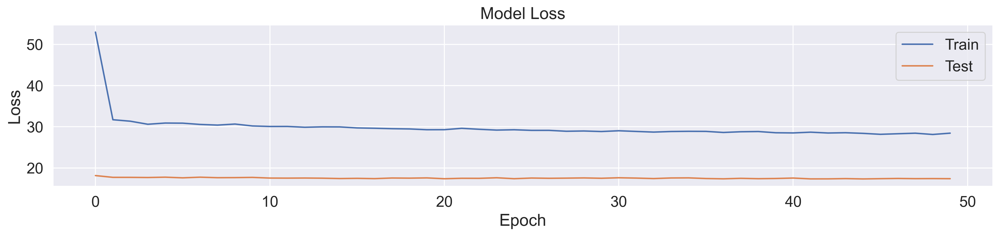

In [75]:
# Plot loss history
sns.set(font_scale=1.4)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper right')
plt.show()

In [76]:
# Prediction on the test set
yhat = model.predict(test_x)
yhat

221/221 [==============================] - 1s 2ms/step


array([[6.1268864],
       [6.944149 ],
       [6.3943896],
       ...,
       [6.686078 ],
       [7.970878 ],
       [6.1730075]], dtype=float32)

In [77]:
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(test_y, yhat))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 4.170


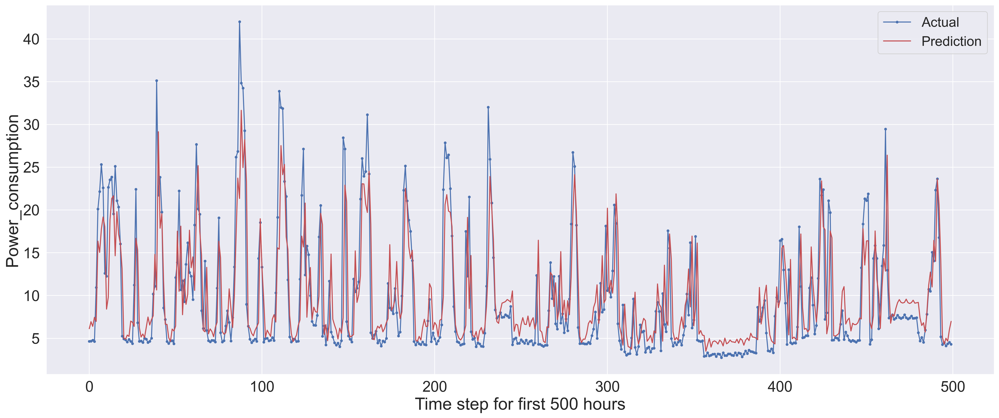

In [78]:
# Visualization of the predicted vs. actual for the first 500 time-stepps
sns.set(font_scale=2)
aa=[x for x in range(500)]
plt.figure(figsize=(25,10)) 
plt.plot(aa, test_y[:500], marker='.', label="Actual")
plt.plot(aa, yhat[:500], 'r', label="Prediction")
plt.ylabel(df_resample.columns[0], size=25)
plt.xlabel('Time step for first 500 hours', size=25)
plt.legend(fontsize=20)
plt.show()

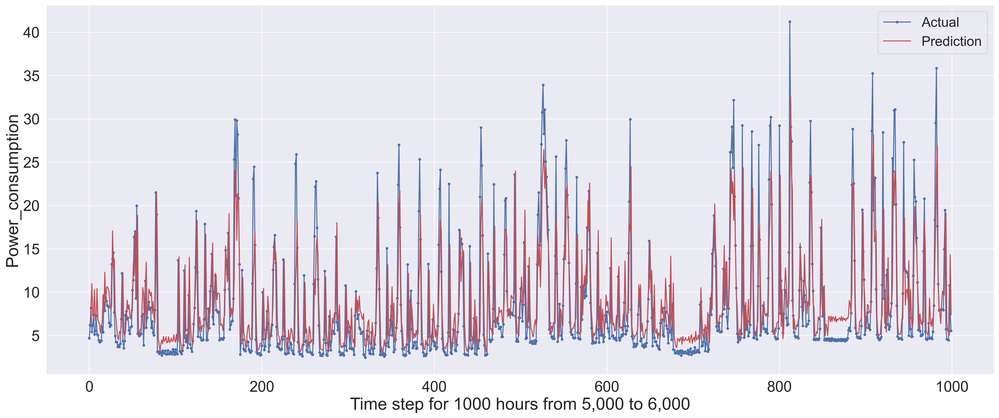

In [79]:
# Visualization of the predicted vs. actual for the 5,000 to 6,000 time-stepps
sns.set(font_scale=2)
aa=[x for x in range(1000)]
plt.figure(figsize=(25,10)) 
plt.plot(aa, test_y[5000:6000], marker='.', label="Actual")
plt.plot(aa, yhat[5000:6000], 'r', label="Prediction")
plt.ylabel(df_resample.columns[0], size=25)
plt.xlabel('Time step for 1000 hours from 5,000 to 6,000', size=25)
plt.legend(fontsize=20)
plt.show()

### Multi-step LSTM using 5 previous hourly data points to predict 3 future ones
- It takes 5 previous points to predict 3 future points

In [80]:
from keras.layers import RepeatVector
from keras.layers import TimeDistributed

In [81]:
reframed_5_3 = series_to_supervised(df_resample, 5, 3)
reframed_5_3

,var1(t-5),var1(t-4),var1(t-3),var1(t-2),var1(t-1),var1(t),var1(t+1),var1(t+2)
Date_time,,,,,,,,
2006-12-16 22:00:00,52.992593,36.953333,38.553889,37.692778,33.307778,32.102222,34.276667,30.907778
2006-12-16 23:00:00,36.953333,38.553889,37.692778,33.307778,32.102222,34.276667,30.907778,30.590000
2006-12-17 00:00:00,38.553889,37.692778,33.307778,32.102222,34.276667,30.907778,30.590000,25.887778
2006-12-17 01:00:00,37.692778,33.307778,32.102222,34.276667,30.907778,30.590000,25.887778,26.936667
2006-12-17 02:00:00,33.307778,32.102222,34.276667,30.907778,30.590000,25.887778,26.936667,27.479444
...,...,...,...,...,...,...,...,...
2010-12-11 17:00:00,8.465556,13.363889,15.265556,14.829444,19.644444,30.851667,38.014444,26.382778
2010-12-11 18:00:00,13.363889,15.265556,14.829444,19.644444,30.851667,38.014444,26.382778,10.005556
2010-12-11 19:00:00,15.265556,14.829444,19.644444,30.851667,38.014444,26.382778,10.005556,9.581667


In [82]:
# Create the train and test data. The first 27,000 first data points are the train set.
values = reframed_5_3.values
n_train_time = 27000
train = values[:n_train_time, :]
test = values[n_train_time:, :]
train_x, train_y = train[:, :-3], train[:, -3:]
test_x, test_y = test[:, :-3], test[:, -3:]

In [83]:
train_x = train_x.reshape((train_x.shape[0], train_x.shape[1], 1))
test_x = test_x.reshape((test_x.shape[0], test_x.shape[1], 1))

In [84]:
model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(train_x.shape[1], 1)))
model.add(Dropout(0.1))
model.add(RepeatVector(3))
model.add(TimeDistributed(Dense(1)))
model.compile(loss='mean_squared_error', optimizer='adam')

history = model.fit(train_x, train_y, epochs=50, batch_size=70, validation_data=(test_x, test_y), verbose=2, shuffle=False)

Epoch 1/50
386/386 - 4s - loss: 64.5813 - val_loss: 30.4759 - 4s/epoch - 10ms/step
Epoch 2/50
386/386 - 3s - loss: 51.3051 - val_loss: 29.8828 - 3s/epoch - 7ms/step
Epoch 3/50
386/386 - 3s - loss: 50.5956 - val_loss: 29.9563 - 3s/epoch - 7ms/step
Epoch 4/50
386/386 - 3s - loss: 50.6291 - val_loss: 29.9837 - 3s/epoch - 7ms/step
Epoch 5/50
386/386 - 3s - loss: 50.0592 - val_loss: 30.0363 - 3s/epoch - 7ms/step
Epoch 6/50
386/386 - 3s - loss: 49.9893 - val_loss: 29.8490 - 3s/epoch - 7ms/step
Epoch 7/50
386/386 - 3s - loss: 49.7269 - val_loss: 29.9512 - 3s/epoch - 7ms/step
Epoch 8/50
386/386 - 3s - loss: 49.8269 - val_loss: 29.6274 - 3s/epoch - 7ms/step
Epoch 9/50
386/386 - 3s - loss: 49.4829 - val_loss: 30.3837 - 3s/epoch - 7ms/step
Epoch 10/50
386/386 - 3s - loss: 49.4948 - val_loss: 29.9021 - 3s/epoch - 7ms/step
Epoch 11/50
386/386 - 3s - loss: 49.2232 - val_loss: 29.8253 - 3s/epoch - 7ms/step
Epoch 12/50
386/386 - 3s - loss: 49.4945 - val_loss: 29.8634 - 3s/epoch - 7ms/step
Epoch 13/50


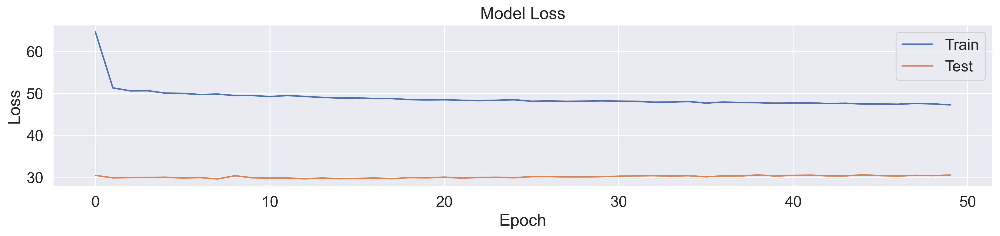

In [85]:
# Plot loss history
sns.set(font_scale=1.4)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper right')
plt.show()

In [86]:
# Prediction test
yhat = model.predict(test_x)
yhat

220/220 [==============================] - 1s 3ms/step


array([[[ 8.453146],
        [ 8.453146],
        [ 8.453146]],

       [[ 9.400521],
        [ 9.400521],
        [ 9.400521]],

       [[17.468319],
        [17.468319],
        [17.468319]],

       ...,

       [[26.181952],
        [26.181952],
        [26.181952]],

       [[13.933351],
        [13.933351],
        [13.933351]],

       [[ 7.099724],
        [ 7.099724],
        [ 7.099724]]], dtype=float32)

## 6. Conclusion and Future Work
- LSTM produces more representative results than ML algorithms
- Tuning the LSTM model is needed to improve results
- Multi-step LSTM is next step as it enables producing several future predictions
- Main goal in tuning the model is to balance the number of the previous measurements and the future ones, in order to produce results that are close to actual